#Analysis of a Kaggle dataset related to credit card data

Import packages

In [1]:
import numpy as np
import pandas as pd
import scipy
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import scale
from sklearn import linear_model
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
import random

import matplotlib.pyplot as plt
import seaborn as sns


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


import data

In [5]:
data = pd.read_csv('creditcard.csv')
data = data.sample(frac=1).reset_index(drop='True')
data.head()


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,54085.0,1.240297,0.228934,0.043675,1.000807,0.177296,0.016808,0.013276,0.061312,0.175233,0.033517,-1.088964,-0.577347,-1.023859,0.573339,1.334152,0.178031,-0.409514,-0.373306,-0.366657,-0.218408,-0.215315,-0.637278,-0.014304,-0.836404,0.464311,-0.450600,0.024801,0.012261,6.99,0
1,166272.0,0.007545,0.879440,0.477476,-0.484839,0.236012,-1.377076,1.013683,-0.241661,-0.095468,-0.412794,-0.522186,0.364227,0.097412,0.106021,-0.451376,-0.224651,-0.264005,-0.906252,-0.243258,-0.042981,-0.231016,-0.481290,0.117522,0.457476,-0.540346,0.111675,0.249014,0.102186,0.89,0
2,50240.0,-0.934154,0.705075,1.991370,-0.360965,0.970368,0.176795,1.253626,-0.270610,-0.473439,-0.147681,1.082334,0.117582,-0.618800,-0.008958,-0.126914,0.274085,-1.093148,0.128819,-1.211245,-0.082902,0.080142,0.449368,-0.513561,-0.312994,0.590772,-0.449392,-0.404480,-0.406506,39.99,0
3,78899.0,-1.032146,0.471027,0.970447,-2.017917,-0.300693,-0.241894,-0.156795,0.783898,1.009599,-1.559135,0.554356,0.587560,-1.542912,0.648522,0.037002,-0.349998,-0.167515,0.470356,0.079636,-0.197332,0.158552,0.515360,-0.176894,-0.330045,-0.038284,-0.786240,0.306012,0.107112,5.00,0
4,166472.0,2.259254,-1.579907,-1.253815,-1.849433,-0.846984,0.146924,-1.231422,-0.031200,-1.277150,1.711403,-0.525252,-0.479919,0.684612,-0.391027,-0.732539,0.092579,-0.279114,0.886651,0.603648,-0.298140,-0.171042,-0.074648,0.036392,-1.401367,-0.112517,-0.117217,0.008594,-0.063204,56.00,0


The features are already scaled and the names of features are not shown due to privacy reasons.

In [6]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.140762e-15,3.764236e-16,-1.411447e-15,2.075434e-15,1.021836e-15,1.503621e-15,-5.571045e-16,1.361766e-16,-2.382892e-15,2.236368e-15,1.694560e-15,-1.264974e-15,8.327738e-16,1.236453e-15,4.854992e-15,1.435545e-15,-3.814608e-16,9.586088e-16,1.038735e-15,6.716327e-16,1.527381e-16,-3.628266e-16,2.671350e-16,4.473314e-15,5.200781e-16,1.688734e-15,-3.587368e-16,-1.191135e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,1.020713e+00,9.992014e-01,9.952742e-01,9.585956e-01,9.153160e-01,8.762529e-01,8.493371e-01,8.381762e-01,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,-4.797473e+00,-1.868371e+01,-5.791881e+00,-1.921433e+01,-4.498945e+00,-1.412985e+01,-2.516280e+01,-9.498746e+00,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,-7.624942e-01,-4.055715e-01,-6.485393e-01,-4.255740e-01,-5.828843e-01,-4.680368e-01,-4.837483e-01,-4.988498e-01,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,-3.275735e-02,1.400326e-01,-1.356806e-02,5.060132e-02,4.807155e-02,6.641332e-02,-6.567575e-02,-3.636312e-03,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,7.395934e-01,6.182380e-01,6.625050e-01,4.931498e-01,6.488208e-01,5.232963e-01,3.996750e-01,5.008067e-01,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,1.201891e+01,7.848392e+00,7.126883e+00,1.052677e+01,8.877742e+00,1.731511e+01,9.253526e+00,5.041069e+00,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


Check for missing values

In [0]:
data.isna().sum().max()
if data.isna().sum().max() > 0:
  more_info = data.isnull().any()
  print(more_info)

In [8]:
nan_rows = data[data.isnull().any(1)]
nan_rows

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class


Split the data in fraud and non-fraud

In [9]:
fraud = data.loc[data['Class'] == 1]
non_fraud = data.loc[data['Class'] == 0]
print(len(fraud))
print(len(non_fraud))

492
284315


#Plot/investigate different features

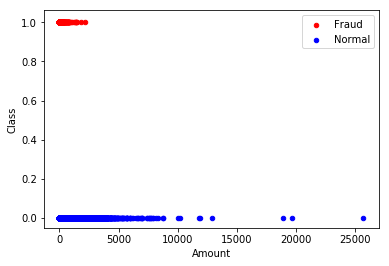

In [10]:
ax = fraud.plot.scatter(x='Amount',y='Class', color='Red', label='Fraud')
non_fraud.plot.scatter(x='Amount',y='Class', color='Blue', label='Normal',ax = ax)
plt.show()

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


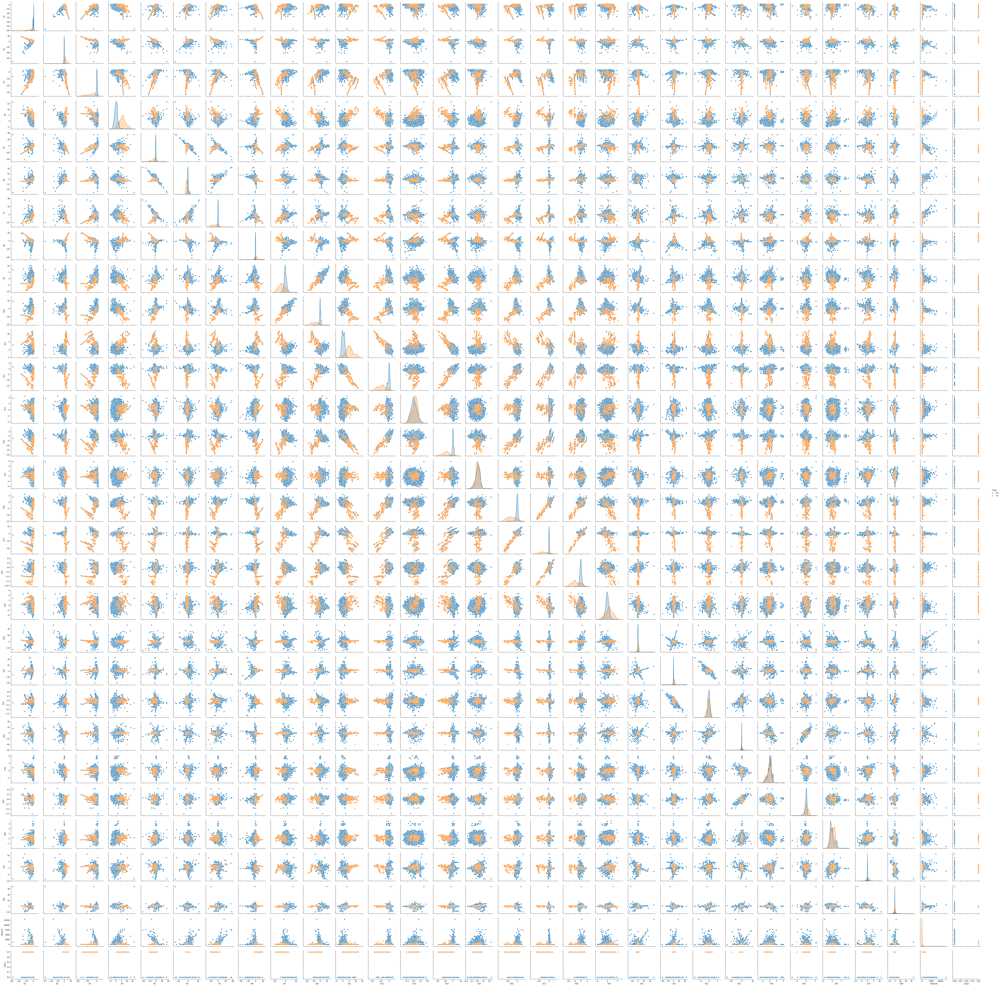

In [4]:
sns.pairplot(data.loc[:,data.dtypes == 'float64'], hue='Class')


Correlations (Fraud only)

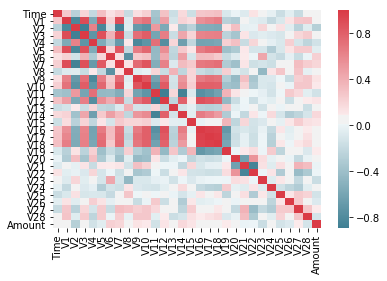

In [11]:
corr_fraud = fraud.loc[:,fraud.dtypes == 'float64'].corr()
sns.heatmap(corr_fraud, xticklabels=corr_fraud.columns, yticklabels=corr_fraud.columns, cmap=sns.diverging_palette(220, 10, as_cmap=True))

Correlations (non-fraud only)

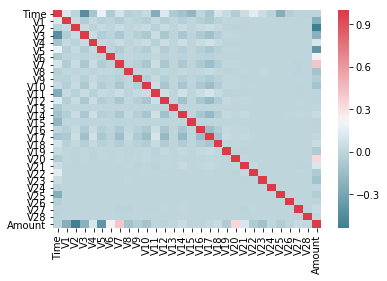

In [12]:
corr_normal = non_fraud.loc[:,non_fraud.dtypes == 'float64'].corr()
sns.heatmap(corr_normal, xticklabels=corr_normal.columns, yticklabels=corr_normal.columns, cmap=sns.diverging_palette(220, 10, as_cmap=True))

Correlations (all data)

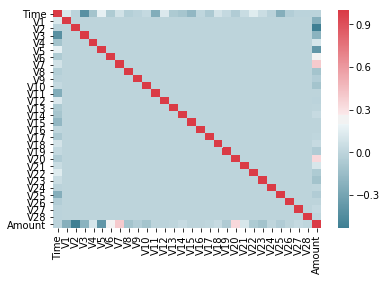

In [14]:
corr_data = data.loc[:,data.dtypes == 'float64'].corr()
sns.heatmap(corr_data, xticklabels=corr_data.columns, yticklabels=corr_data.columns, cmap=sns.diverging_palette(220, 10, as_cmap=True))

#Logistic regression and data preparation

In [0]:
x = data.iloc[:,:-1]
y= data['Class']
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3)

Simple version

In [16]:
logistic = linear_model.LogisticRegression(C=1e5)
logistic.fit(x_train,y_train)
print('Test score:', logistic.score(x_test,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9988296291094648


Select subset of features whose empirical distribution varies from fraud/non-fraud

In [17]:
chosen_data = data.drop(['V1','V2','V3','V5','V6','V8','V13','V15','V19','V20','V21','V22','V23','V24','V25','V26','V27','V28'],axis=1)
print(chosen_data.head())

       Time        V4        V7        V9  ...       V17       V18  Amount  Class
0   54085.0  1.000807  0.013276  0.175233  ... -0.409514 -0.373306    6.99      0
1  166272.0 -0.484839  1.013683 -0.095468  ... -0.264005 -0.906252    0.89      0
2   50240.0 -0.360965  1.253626 -0.473439  ... -1.093148  0.128819   39.99      0
3   78899.0 -2.017917 -0.156795  1.009599  ... -0.167515  0.470356    5.00      0
4  166472.0 -1.849433 -1.231422 -1.277150  ... -0.279114  0.886651   56.00      0

[5 rows x 13 columns]


This selection was not very rigorous, hence we should check for correlations

In [18]:
refine = (chosen_data.corr().where(np.triu(np.ones(chosen_data.corr().shape), k=1).astype(np.bool))
                 .stack()
                 .sort_values(ascending=False))
print(refine)

V7      Amount    3.973113e-01
V11     Class     1.548756e-01
V4      Class     1.334475e-01
Time    V12       1.243481e-01
V4      Amount    9.873167e-02
Time    V18       9.043813e-02
        V7        8.471437e-02
V18     Amount    3.565034e-02
V14     Amount    3.375117e-02
Time    V10       3.061663e-02
        V16       1.190287e-02
V17     Amount    7.309042e-03
Amount  Class     5.631753e-03
V11     Amount    1.039770e-04
V16     V17       1.789520e-15
V14     V17       1.063592e-15
V9      V14       9.392339e-16
V10     V12       7.897834e-16
V7      V12       6.855064e-16
V11     V17       6.826965e-16
V9      V17       6.620459e-16
V10     V14       6.347205e-16
V4      V9        6.014960e-16
V10     V17       5.907788e-16
V7      V17       5.889712e-16
V10     V18       5.384923e-16
V7      V16       4.923047e-16
V12     V16       4.446969e-16
        V14       4.362119e-16
V9      V11       2.718379e-16
                      ...     
V10     V11      -2.822944e-16
V4      

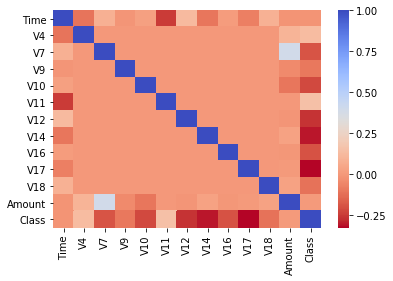

In [19]:
sns.heatmap(chosen_data.corr(), cmap='coolwarm_r', annot_kws={'size':20})

Based on the plot and values, the selection seems not too bad

In [0]:
x_c = chosen_data.iloc[:,:-1]
y_c = chosen_data['Class']
x_train_c, x_test_c, y_train_c, y_test_c = train_test_split(x_c,y_c, test_size=0.3)

Simple version with **altered inputs**

In [21]:
logistic_c = linear_model.LogisticRegression(C=1e5)
logistic_c.fit(x_train_c,y_train_c)
print('Test score:', logistic_c.score(x_test_c,y_test_c))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9988062216916541


**Deal with inbalanced datasets** (without normalization)

Using SMOT only on the training data

In [0]:
sm = SMOTE(random_state=12, ratio = 1.0)
x_train_res, y_train_res = sm.fit_sample(x_train, y_train)


In [23]:
logistic_res = linear_model.LogisticRegression(C=1e5)
logistic_res.fit(x_train_res,y_train_res)
print('Test score:', logistic_res.score(x_test,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9836265112414124


Only with the preselected data

In [0]:
sm = SMOTE(random_state=12, ratio = 1.0)
x_train_c_res, y_train_c_res = sm.fit_sample(x_train_c, y_train_c)


In [25]:
logistic_c_res = linear_model.LogisticRegression(C=1e5)
logistic_c_res.fit(x_train_c_res,y_train_c_res)
print('Test score:', logistic_c_res.score(x_test_c,y_test_c))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9740645810657398


In [26]:
y_predict_c_res = np.array(logistic_c_res.predict(x_test_c))
print(y_predict_c_res)

[0 0 0 ... 1 0 0]


**The same approach with normalized data** (test data is normalized with respect to the parameters from the training normalization. Otherwise we incorporate "unknown" information)

In [0]:
data_n = data
x_train_n = x_train
x_test_n = x_test

In [29]:
for feature in x_train.columns.values[:]:
    mean, std = data[feature].mean(), data[feature].std()
    x_train_n.loc[:, feature] = (x_train[feature] - mean) / std
    x_test_n.loc[:, feature] = (x_test[feature] - mean) / std

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:635: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item_labels[indexer[info_axis]]] = value


Simple version

In [30]:
logistic_n = linear_model.LogisticRegression(C=1e5)
logistic_n.fit(x_train_n,y_train)
print('Test score:', logistic_n.score(x_test_n,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9992275552122467


Select subset of features whose empirical distribution varies from fraud/non-fraud

In [33]:
x_train_c_n = x_train_n.drop(['V1','V2','V3','V5','V6','V8','V13','V15','V19','V20','V21','V22','V23','V24','V25','V26','V27','V28'],axis=1)
x_test_c_n = x_test_n.drop(['V1','V2','V3','V5','V6','V8','V13','V15','V19','V20','V21','V22','V23','V24','V25','V26','V27','V28'],axis=1)
print(x_train_c_n.head())

            Time        V4        V7  ...       V17       V18    Amount
88947  -1.996601  0.530322  0.570138  ...  0.586525 -0.826585 -0.353203
37440  -1.996568 -0.000925 -0.128208  ...  0.117052 -2.067910 -0.354569
48368  -1.996604 -0.146785 -0.573950  ...  0.501666 -1.151957 -0.349824
51273  -1.996584  0.343776  0.077515  ... -0.044097 -0.507231 -0.354609
213204 -1.996593 -1.502465 -0.326484  ... -0.195550  2.239017 -0.354593

[5 rows x 12 columns]


Simple version with **altered inputs**

In [34]:
logistic_c_n = linear_model.LogisticRegression(C=1e5)
logistic_c_n.fit(x_train_c_n,y_train_c)
print('Test score:', logistic_c_n.score(x_test_c_n,y_test_c))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.9983731844621561


**Deal with inbalanced datasets** (with normalization)

Using SMOT only on the training data

In [0]:
sm = SMOTE(random_state=12, ratio = 1.0)
x_train_n_res, y_train_n_res = sm.fit_sample(x_train_n, y_train)


In [36]:
logistic_n_res = linear_model.LogisticRegression(C=1e5)
logistic_n_res.fit(x_train_n_res,y_train_n_res)
print('Test score:', logistic_res.score(x_test_n,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.7677867116089089


Only with the preselected data

In [0]:
sm = SMOTE(random_state=12, ratio = 1.0)
x_train_c_n_res, y_train_c_n_res = sm.fit_sample(x_train_c_n, y_train)


In [38]:
logistic_c_n_res = linear_model.LogisticRegression(C=1e5)
logistic_c_n_res.fit(x_train_c_n_res,y_train_c_n_res)
print('Test score:', logistic_c_res.score(x_test_c_n,y_test))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Test score: 0.7106843158596959


# Random forest

Without resampling

In [39]:
ccf_rf = RandomForestClassifier(n_estimators=25, random_state=12)
ccf_rf.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=25,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

In [40]:
print('Test Results')
print(ccf_rf.score(x_test, y_test))
print(recall_score(y_test, ccf_rf.predict(x_test)))

Test Results
0.9996137776061234
0.803921568627451


With resampling

In [41]:
ccf_rf_res = RandomForestClassifier(n_estimators=25, random_state=12)
ccf_rf_res.fit(x_train_res, y_train_res)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=25,
                       n_jobs=None, oob_score=False, random_state=12, verbose=0,
                       warm_start=False)

In [42]:
print('Test Results')
print(ccf_rf_res.score(x_test, y_test))
print(recall_score(y_test, ccf_rf.predict(x_test)))

Test Results
0.9982444436641972
0.803921568627451


# Results

In [43]:
results = {'Logistic regression':[logistic.score(x_test,y_test), recall_score(y_test, logistic.predict(x_test))],'Logistic (selected data)':[logistic_c.score(x_test_c,y_test),recall_score(y_test, logistic_c.predict(x_test_c))],
          'Logistic regression SMOT':[logistic_res.score(x_test,y_test), recall_score(y_test, logistic_res.predict(x_test))],'Logistic SMOT selected':[logistic_c_res.score(x_test_c,y_test), recall_score(y_test, logistic_c_res.predict(x_test_c))],
          'Logistic regression normalized':[logistic_n.score(x_test_n,y_test), recall_score(y_test, logistic_n.predict(x_test_n))],'Logistic (selected data) normalized':[logistic_c_n.score(x_test_c_n,y_test),recall_score(y_test, logistic_c_n.predict(x_test_c_n))],
          'Logistic regression SMOT normalized':[logistic_n_res.score(x_test_n,y_test), recall_score(y_test, logistic_n_res.predict(x_test_n))],'Logistic SMOT selected normalized':[logistic_c_n_res.score(x_test_c_n,y_test), recall_score(y_test, logistic_c_n_res.predict(x_test_c_n))],
          'Random forest':[ccf_rf.score(x_test, y_test),recall_score(y_test, ccf_rf.predict(x_test))], 'Random forest SMOT':[ccf_rf_res.score(x_test, y_test),recall_score(y_test, ccf_rf_res.predict(x_test))]}
results_df = pd.DataFrame(results)
results_df.rename(index={0:'Test score',1:'# fraud detected correctly'}, inplace=True)
results_df

,Logistic regression,Logistic (selected data),Logistic regression SMOT,Logistic SMOT selected,Logistic regression normalized,Logistic (selected data) normalized,Logistic regression SMOT normalized,Logistic SMOT selected normalized,Random forest,Random forest SMOT
Test score,0.831853,0.996793,0.767787,0.971115,0.999228,0.998209,0.973023,0.972251,0.999614,0.998244
# fraud detected correctly,0.908497,0.000000,0.967320,0.039216,0.640523,0.000000,0.895425,0.901961,0.803922,0.032680


**Confusion matrices**

A short function which takes care of creating and plotting the confusion matrices

In [0]:
def plot_confusion_matrix(y_true, y_pred,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = unique_labels(y_true, y_pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

Normalized confusion matrix
[[0.83171532 0.16828468]
 [0.09150327 0.90849673]]
Normalized confusion matrix
[[0.99858131 0.00141869]
 [1.         0.        ]]
Normalized confusion matrix
[[0.76742877 0.23257123]
 [0.03267974 0.96732026]]
Normalized confusion matrix
[[0.97278696 0.02721304]
 [0.96078431 0.03921569]]
Normalized confusion matrix
[[9.99871028e-01 1.28971743e-04]
 [3.59477124e-01 6.40522876e-01]]
Normalized confusion matrix
[[1. 0.]
 [1. 0.]]
Normalized confusion matrix
[[0.97316215 0.02683785]
 [0.10457516 0.89542484]]
Normalized confusion matrix
[[0.9723766  0.0276234 ]
 [0.09803922 0.90196078]]
Normalized confusion matrix
[[9.99964826e-01 3.51741119e-05]
 [1.96078431e-01 8.03921569e-01]]
Normalized confusion matrix
[[9.99976551e-01 2.34494079e-05]
 [9.67320261e-01 3.26797386e-02]]


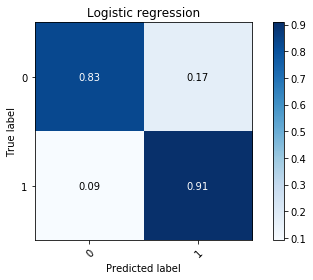

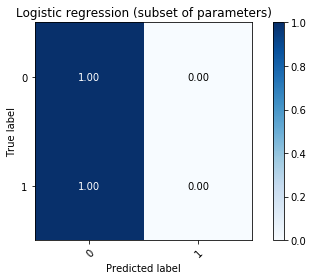

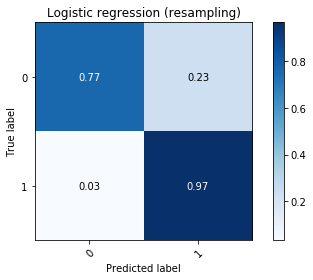

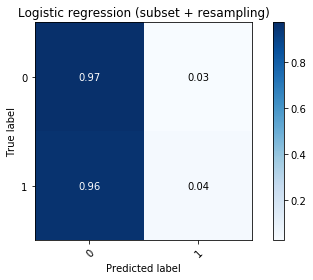

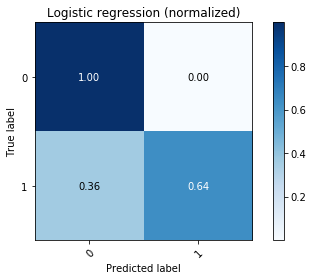

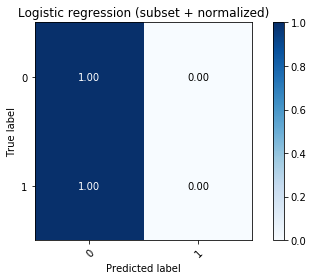

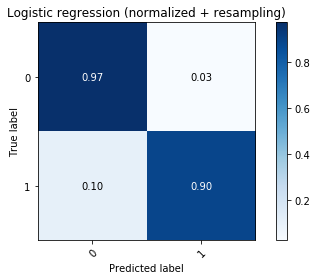

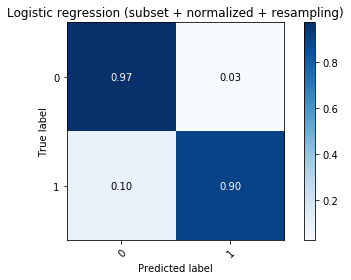

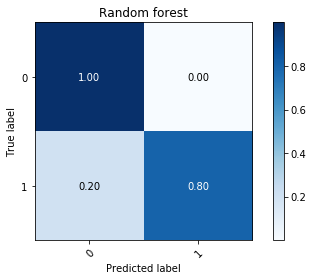

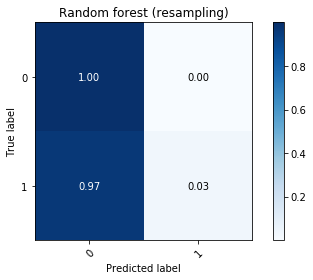

In [45]:
plot_confusion_matrix(y_test, logistic.predict(x_test), normalize=True ,title = 'Logistic regression')
plot_confusion_matrix(y_test, logistic_c.predict(x_test_c), normalize=True,title = 'Logistic regression (subset of parameters)')
plot_confusion_matrix(y_test, logistic_res.predict(x_test), normalize=True, title = 'Logistic regression (resampling)')
plot_confusion_matrix(y_test, logistic_c_res.predict(x_test_c), normalize=True, title = 'Logistic regression (subset + resampling)')
plot_confusion_matrix(y_test, logistic_n.predict(x_test_n), normalize=True, title = 'Logistic regression (normalized)')
plot_confusion_matrix(y_test, logistic_c_n.predict(x_test_c_n), normalize=True, title = 'Logistic regression (subset + normalized)')
plot_confusion_matrix(y_test, logistic_n_res.predict(x_test_n), normalize=True, title = 'Logistic regression (normalized + resampling)')
plot_confusion_matrix(y_test, logistic_c_n_res.predict(x_test_c_n), normalize=True, title = 'Logistic regression (subset + normalized + resampling)')
plot_confusion_matrix(y_test, ccf_rf.predict(x_test), normalize=True, title = 'Random forest')
plot_confusion_matrix(y_test, ccf_rf_res.predict(x_test), normalize=True, title = 'Random forest (resampling)')